In [4]:
import os
import io
import time
import glob
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
files_grabbed = []
files_info = []
path_check_include = ''

path_ign = os.getcwd() + '/data'
files_grabbed = glob.glob(os.path.join(path_ign, '*.jp2'))
files_info = glob.glob(os.path.join(path_ign, '*.tab'))
files_grabbed = [x for x in files_grabbed if path_check_include in x]
files_info = [x for x in files_info if path_check_include in x]

print("- nombre d'images:", len(files_grabbed), ', nb files info coord:', len(files_info))

- nombre d'images: 191 , nb files info coord: 191


In [6]:
f_info = files_info[0]

file1 = open(f_info, 'r')
Lines = file1.readlines()
file1.close()
for line in Lines:
    print(line)

!table

!version 300

!charset WindowsLatin1



Definition Table

File "84-2018-0830-6355-LA93-0M50-IRC-E080.jp2"

Type "RASTER"

(830000.00,6355000.00) (0,0) Label "Pt 1",

(835000.00,6355000.00) (10000,0) Label "Pt 2",

(835000.00,6350000.00) (10000,10000) Label "Pt 3",

(830000.00,6350000.00) (0,10000) Label "Pt 4"

CoordSys Earth Projection 2003, 33, 7, 3, 46.5, 44, 49.00000000001, 700000, 6600000, -792421, 5278231, 3520778, 9741029

Units "m"



/home/coartix/S9-EPITA/ALEIA/General/PoolFinder/data/84-2018-0870-6310-LA93-0M50-IRC-E080.jp2
5.418367624282837


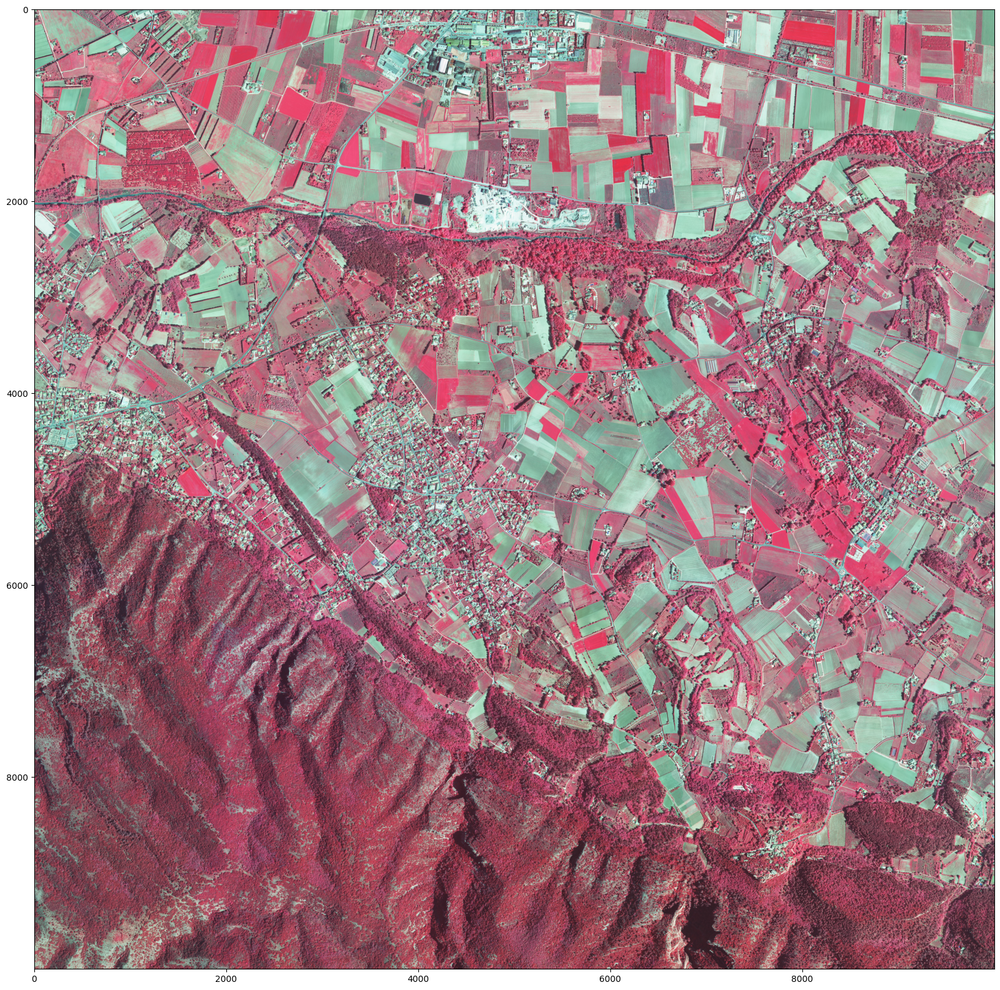

In [7]:
def read_one(fname):
    img = cv2.imread(fname)      
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    return img
fname = files_grabbed[0]
print(fname)
ts = time.time()
img = read_one(fname)
print(time.time() - ts)
plt.figure(figsize = (30, 20))
plt.imshow(img)
plt.show()

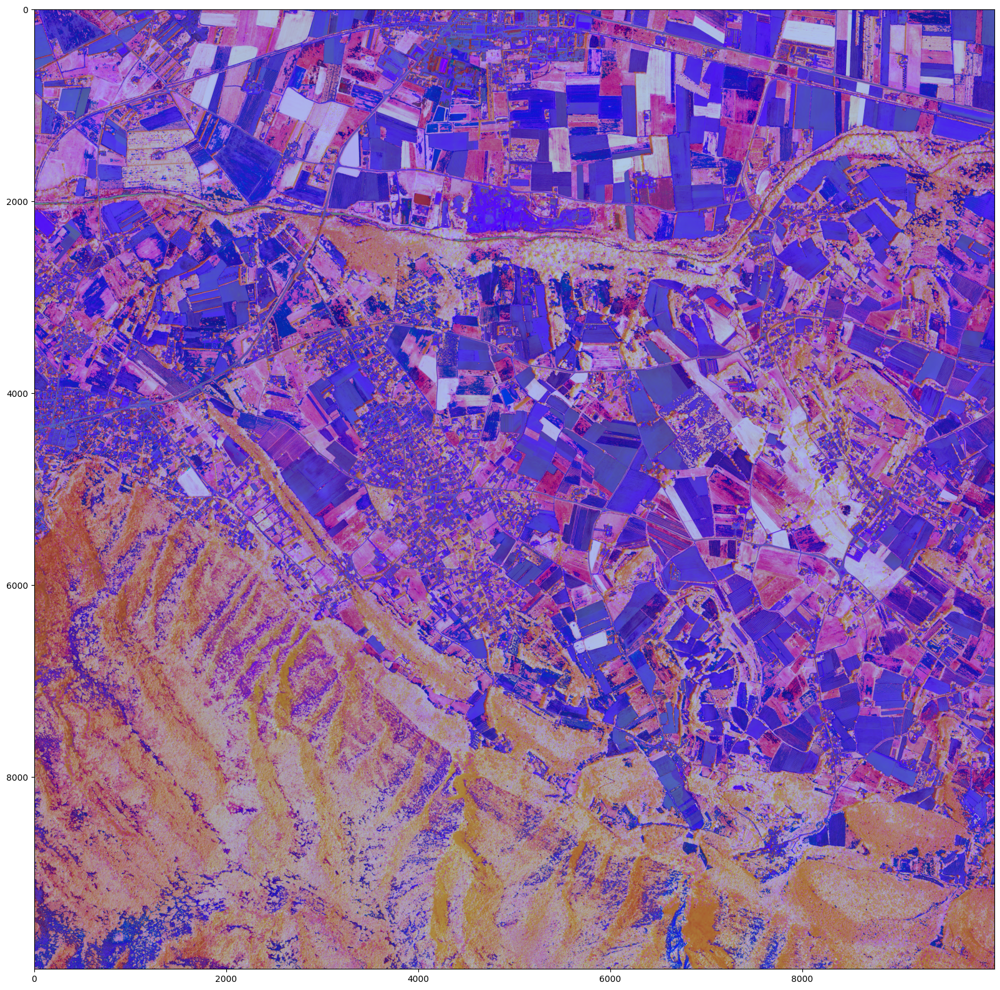

In [8]:
# Transform images in HSV
img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
plt.figure(figsize = (30, 20))
plt.imshow(img_hsv)
plt.show()

256


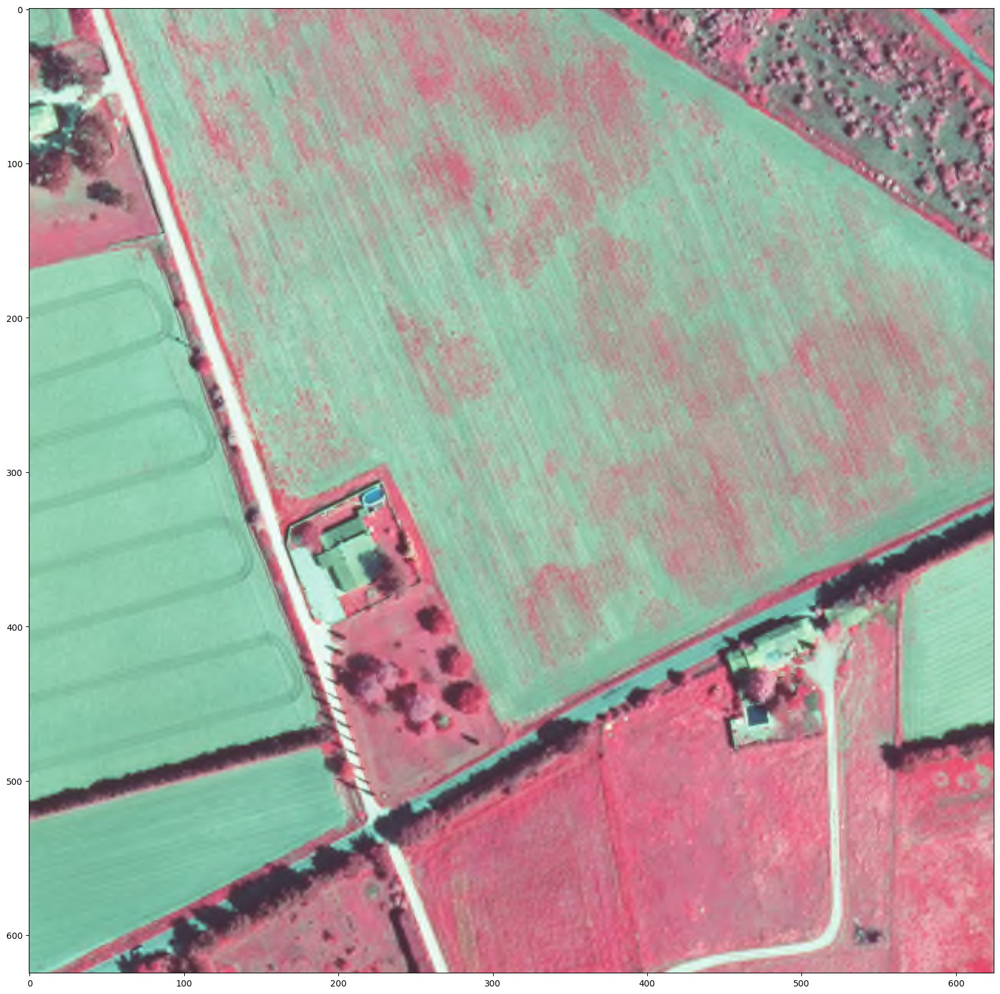

In [9]:
# Split image into smaller images
def split_image(img, nb_split):
    img_split = []
    h, w, c = img.shape
    for i in range(nb_split):
        for j in range(nb_split):
            img_split.append(img[i*h//nb_split:(i+1)*h//nb_split, j*w//nb_split:(j+1)*w//nb_split, :])
    return img_split

img_split = split_image(img, 16)
print(len(img_split))
plt.figure(figsize = (30, 20))
plt.imshow(img_split[0])
plt.show()

### Using sam model

In [7]:
# !pip install -q git+https://github.com/huggingface/transformers

In [8]:
import torch
# Import sam vit pretrained model
from transformers import SamModel, SamProcessor

2023-12-06 22:51:35.835773: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [10]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))  

def show_boxes_on_image(raw_image, boxes):
    plt.figure(figsize=(10,10))
    plt.imshow(raw_image)
    for box in boxes:
      show_box(box, plt.gca())
    plt.axis('on')
    plt.show()

def show_points_on_image(raw_image, input_points, input_labels=None):
    plt.figure(figsize=(10,10))
    plt.imshow(raw_image)
    input_points = np.array(input_points)
    if input_labels is None:
      labels = np.ones_like(input_points[:, 0])
    else:
      labels = np.array(input_labels)
    show_points(input_points, labels, plt.gca())
    plt.axis('on')
    plt.show()

def show_points_and_boxes_on_image(raw_image, boxes, input_points, input_labels=None):
    plt.figure(figsize=(10,10))
    plt.imshow(raw_image)
    input_points = np.array(input_points)
    if input_labels is None:
      labels = np.ones_like(input_points[:, 0])
    else:
      labels = np.array(input_labels)
    show_points(input_points, labels, plt.gca())
    for box in boxes:
      show_box(box, plt.gca())
    plt.axis('on')
    plt.show()


def show_points_and_boxes_on_image(raw_image, boxes, input_points, input_labels=None):
    plt.figure(figsize=(10,10))
    plt.imshow(raw_image)
    input_points = np.array(input_points)
    if input_labels is None:
      labels = np.ones_like(input_points[:, 0])
    else:
      labels = np.array(input_labels)
    show_points(input_points, labels, plt.gca())
    for box in boxes:
      show_box(box, plt.gca())
    plt.axis('on')
    plt.show()


def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_masks_on_image(raw_image, masks, scores):
    if len(masks.shape) == 4:
      masks = masks.squeeze()
    if scores.shape[0] == 1:
      scores = scores.squeeze()

    nb_predictions = scores.shape[-1]
    fig, axes = plt.subplots(1, nb_predictions, figsize=(15, 15))

    for i, (mask, score) in enumerate(zip(masks, scores)):
      mask = mask.cpu().detach()
      axes[i].imshow(np.array(raw_image))
      show_mask(mask, axes[i])
      axes[i].title.set_text(f"Mask {i+1}, Score: {score.item():.3f}")
      axes[i].axis("off")
    plt.show()

Sam model from huggingface

In [11]:
import torch
from PIL import Image
import requests

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

model = SamModel.from_pretrained("facebook/sam-vit-base").to(device)
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")

Device: cuda


config.json:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/375M [00:00<?, ?B/s]

/home/coartix/.local/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: 'libc10_hip.so: cannot open shared object file: No such file or directory'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

In [12]:
raw_image = Image.open(fname).convert("RGB")
input_points = [[[0, 0]]]

inputs = processor(raw_image, input_points=input_points, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = model(**inputs)

masks = processor.image_processor.post_process_masks(
    outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu()
)
scores = outputs.iou_scores

/usr/lib/python3/dist-packages/PIL/Image.py:2896: DecompressionBombWarning: Image size (100000000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


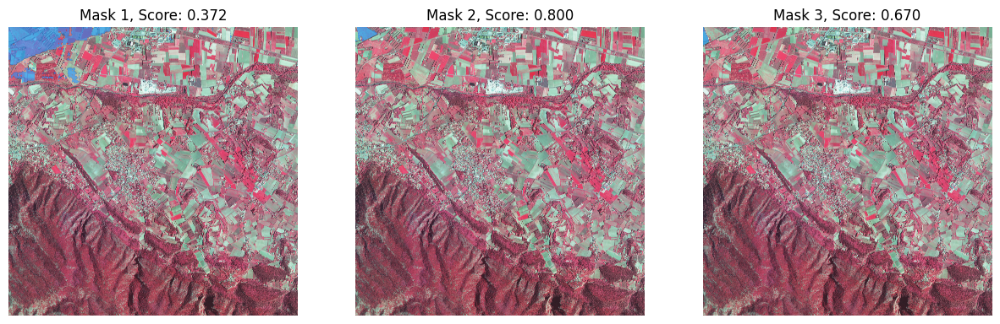

In [13]:
show_masks_on_image(raw_image, masks[0], scores)

Language anything segmentation

In [7]:
!pip install -U git+https://github.com/luca-medeiros/lang-segment-anything.git

Defaulting to user installation because normal site-packages is not writeable
  Cloning https://github.com/luca-medeiros/lang-segment-anything.git to /tmp/pip-req-build-217mt8rt
  Running command git clone --filter=blob:none --quiet https://github.com/luca-medeiros/lang-segment-anything.git /tmp/pip-req-build-217mt8rt
  Resolved https://github.com/luca-medeiros/lang-segment-anything.git to commit 134a48a81ebd691686187ecce2d016fb327a8852
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Cloning https://github.com/IDEA-Research/GroundingDINO.git to /tmp/pip-install-vo5g59o5/groundingdino_35b4e9f3ecd84a759c2f362422cc153f
  Running command git clone --filter=blob:none --quiet https://github.com/IDEA-Research/GroundingDINO.git /tmp/pip-install-vo5g59o5/groundingdino_35b4e9f3ecd84a759c2f362422cc153f
  Resolved https://github.com/IDEA-Research/GroundingDINO.git to commit 16e6b4bfcf6ed3a6f0ef2bc5752d716657a6

In [2]:
from  PIL  import  Image
from lang_sam import LangSAM
from lang_sam.utils import draw_image

model = LangSAM()

/home/coartix/.local/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: 'libc10_hip.so: cannot open shared object file: No such file or directory'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
/home/coartix/.local/lib/python3.10/site-packages/groundingdino/models/GroundingDINO/ms_deform_attn.py:31: UserWarning: Failed to load custom C++ ops. Running on CPU mode Only!
  warnings.warn("Failed to load custom C++ ops. Running on CPU mode Only!")
/home/coartix/.local/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, *

final text_encoder_type: bert-base-uncased
Model loaded from /home/coartix/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


In [19]:
import torch
# Convert split_image[0] as an image object with Image
image_pil = Image.fromarray(img_split[0]).convert("RGB")
text_prompt = 'swimming pool'
masks, boxes, labels, logits = model.predict(image_pil, text_prompt)
image = draw_image(image_pil, masks, boxes, labels)

NameError: name '_C' is not defined